<div style="display: flex; align-items: center; justify-content: center; text-align: center;">
  <img src="https://coursereport-s3-production.global.ssl.fastly.net/uploads/school/logo/219/original/CT_LOGO_NEW.jpg" width="100" style="margin-right: 10px;">
  <div>
    <h1><b>Capstone Project</b></h1>
  </div>
</div>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import ConfusionMatrixDisplay

# Part 1: Looking at the Dataset

In [2]:
df = pd.read_csv('data/breast-cancer.csv')
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [3]:
df.shape

(569, 32)

In [4]:
# value counts of our target
df['diagnosis'].value_counts()

diagnosis
B    357
M    212
Name: count, dtype: int64

In [5]:
# Check dtypes
df.dtypes

id                           int64
diagnosis                   object
radius_mean                float64
texture_mean               float64
perimeter_mean             float64
area_mean                  float64
smoothness_mean            float64
compactness_mean           float64
concavity_mean             float64
concave points_mean        float64
symmetry_mean              float64
fractal_dimension_mean     float64
radius_se                  float64
texture_se                 float64
perimeter_se               float64
area_se                    float64
smoothness_se              float64
compactness_se             float64
concavity_se               float64
concave points_se          float64
symmetry_se                float64
fractal_dimension_se       float64
radius_worst               float64
texture_worst              float64
perimeter_worst            float64
area_worst                 float64
smoothness_worst           float64
compactness_worst          float64
concavity_worst     

# Part 2: Cleaning the Dataset

In [6]:
# Check columns
df.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [7]:
df.isnull().sum()

id                         0
diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

In [8]:
# Looks like all the data is already clean!

# Part 3: Exploring the Dataset (EDA)

## **Pairplot**

In [9]:
sns.pairplot(data = df,
             hue = 'diagnosis',
             corner = True);

C:\anaconda\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


## **Scatterplot**

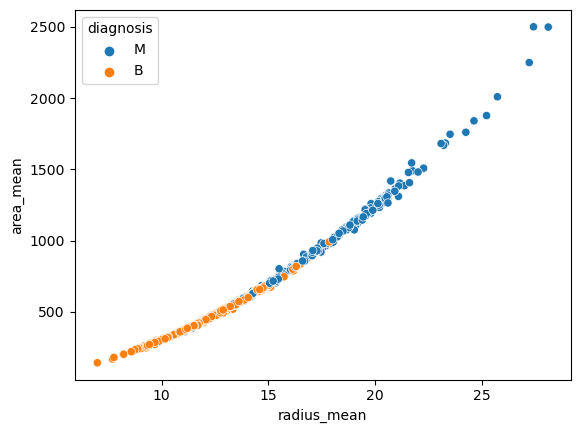

In [11]:
sns.scatterplot(data = df,
                x = 'radius_mean',
                y = 'area_mean',
               hue = 'diagnosis');

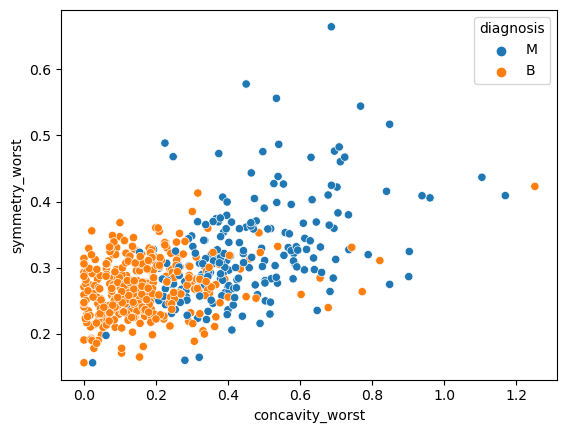

In [18]:
sns.scatterplot(data = df,
                x = 'concavity_worst',
                y = 'symmetry_worst',
               hue = 'diagnosis');

In [ ]:
sns.scatterplot(data = df,
                x = 'radius_mean',
                y = 'area_mean',
               hue = 'diagnosis');

## **Countplot**

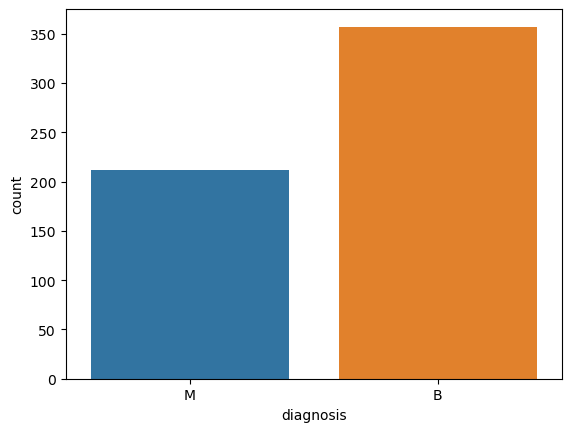

In [12]:
sns.countplot(data = df,
            x = 'diagnosis');

## **Boxplot**

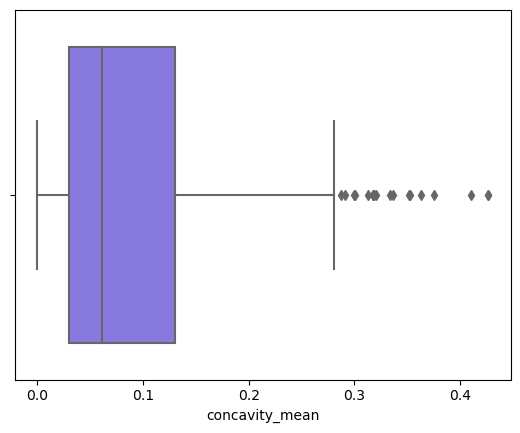

In [22]:
sns.boxplot(data = df,
            x = 'concavity_mean',
           color = 'mediumslateblue');

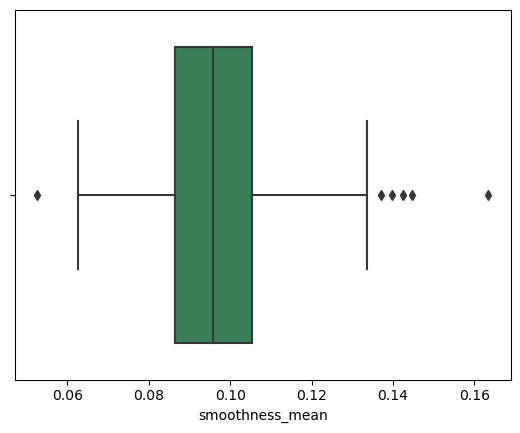

In [24]:
sns.boxplot(data = df,
            x = 'smoothness_mean',
           color = 'seagreen');

## **Histogram**

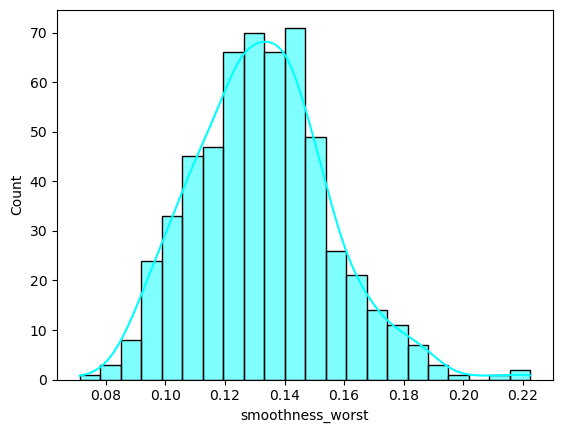

In [26]:
sns.histplot(df['smoothness_worst'], kde = True,
            color = 'cyan');
             

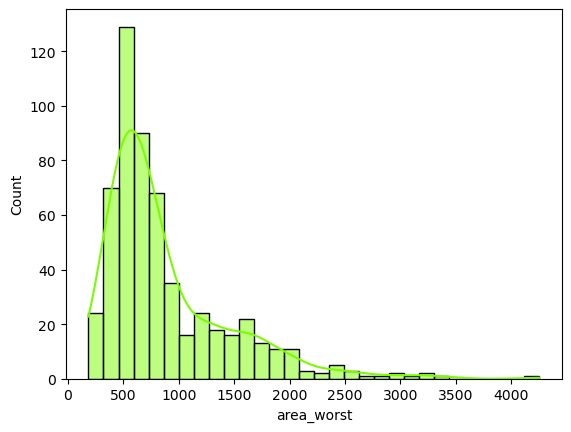

In [ ]:
sns.histplot(df['area_worst'], kde = True,
            color = 'lawngreen');
             

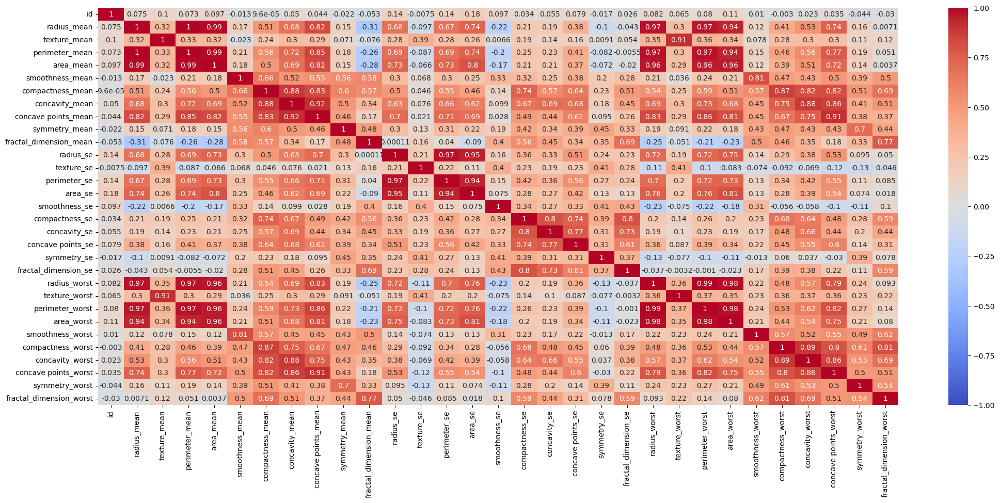

In [68]:
plt.figure(figsize = (25,10))
sns.heatmap(df.corr(numeric_only = True),
            vmin = -1,
            vmax = 1,
            cmap = 'coolwarm',
            annot = True);

# Part 4: Modeling

In [28]:
df['diagnosis'].value_counts(normalize = True)

diagnosis
B    0.627417
M    0.372583
Name: proportion, dtype: float64

In [29]:
X = df.drop(columns = 'diagnosis')
y = df['diagnosis']

In [30]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state = 42)

## `StandardScaler`

In [31]:
sc = StandardScaler()

In [32]:
X_train_sc = sc.fit_transform(X_train)
X_test_sc = sc.transform(X_test)

In [33]:
knn = KNeighborsClassifier()

In [34]:
knn.fit(X_train_sc, y_train)

KNeighborsClassifier()

In [35]:
knn.score(X_train_sc, y_train)

0.9812206572769953

In [36]:
knn.score(X_test_sc, y_test)

0.958041958041958

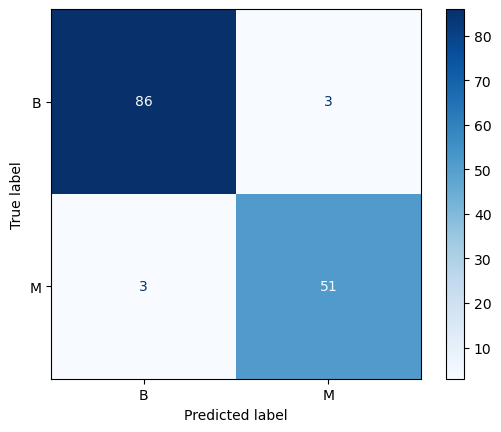

In [37]:
ConfusionMatrixDisplay.from_estimator(knn, X_test_sc, y_test, cmap = 'Blues');

In [38]:
scores = []

for k in range(3, 32, 2):
    knn = KNeighborsClassifier(n_neighbors=k)
    knn.fit(X_train_sc, y_train)
    acc_train = knn.score(X_train_sc, y_train)
    acc_test = knn.score(X_test_sc, y_test)
    scores.append({'k' : k, 'Training Accuracy' : acc_train, 'Test Accuracy' : acc_test})
    
df_score = pd.DataFrame(scores)
df_score

,k,Training Accuracy,Test Accuracy
0,3,0.983568,0.958042
1,5,0.981221,0.958042
2,7,0.969484,0.958042
3,9,0.981221,0.972028
4,11,0.974178,0.972028
5,13,0.974178,0.965035
6,15,0.969484,0.965035
7,17,0.967136,0.958042
8,19,0.962441,0.958042
9,21,0.957746,0.958042


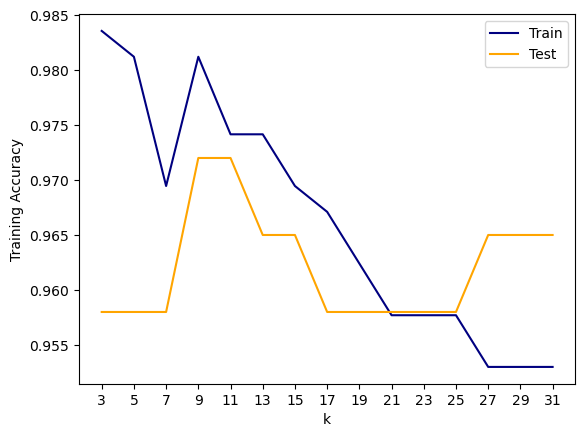

In [39]:
sns.lineplot(data = df_score, x = 'k', y = 'Training Accuracy', c='navy', label='Train')
sns.lineplot(data = df_score, x = 'k', y = 'Test Accuracy', c='orange', label='Test')
plt.xticks(range(3, 32, 2));

In [40]:
knn = KNeighborsClassifier(n_neighbors = 9)
knn.fit(X_train_sc, y_train)

KNeighborsClassifier(n_neighbors=9)

In [41]:
knn.score(X_train_sc, y_train)

0.9812206572769953

In [42]:
knn.score(X_test_sc, y_test)

0.972027972027972

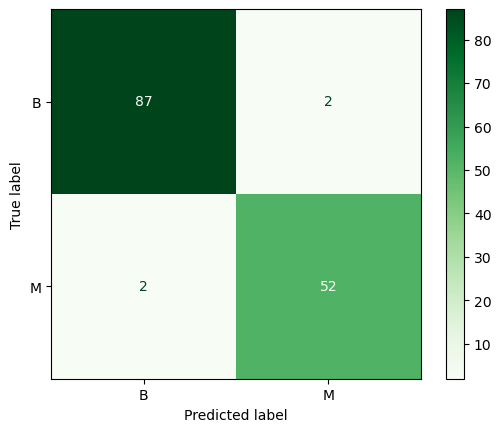

In [43]:
ConfusionMatrixDisplay.from_estimator(knn, X_test_sc, y_test, 
                                      cmap = 'Greens');

## `Logistic Regression`

In [44]:
from sklearn.linear_model import LogisticRegression

In [45]:
logr = LogisticRegression()
logr.fit(X_train_sc, y_train)

LogisticRegression()

In [46]:
logr.score(X_train_sc, y_train)

0.9882629107981221

In [47]:
logr.score(X_test_sc, y_test)

0.9790209790209791

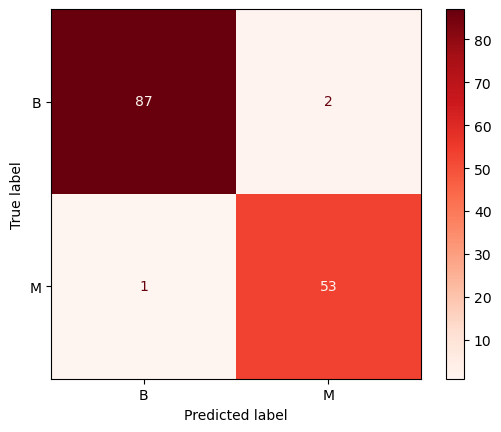

In [48]:
ConfusionMatrixDisplay.from_estimator(logr, X_test_sc, y_test, cmap = 'Reds');

## `Random Forest`

In [49]:
from sklearn.ensemble import RandomForestClassifier

In [50]:
rf = RandomForestClassifier()
rf.fit(X_train_sc, y_train)

RandomForestClassifier()

In [51]:
rf.score(X_train_sc, y_train)

1.0

In [52]:
rf.score(X_test_sc, y_test)

0.972027972027972

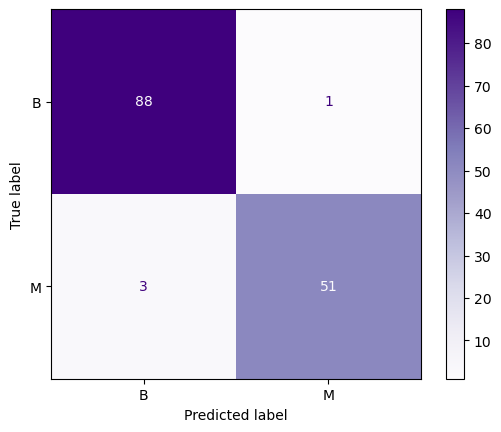

In [53]:
ConfusionMatrixDisplay.from_estimator(rf, X_test_sc, y_test, cmap = 'Purples');